https://towardsdatascience.com/how-to-visualize-convolutional-features-in-40-lines-of-code-70b7d87b0030

In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

seed=42

from fastai.vision import *
from fastai.callbacks.hooks import *
import scipy.ndimage

import gc

np.random.seed(seed)

In [3]:
import cv2
import matplotlib.gridspec as gridspec

In [4]:
# from gradcam import *

In [5]:
# garbage collection on learner
def reset_learner(data,is_fp16=False):
    learn=None
    gc.collect()
    learn = create_cnn(data, models.resnet50, metrics=accuracy)
    if is_fp16:
        learn = learn.to_fp16()
    return learn

The idea is the following: 
- we start with a picture containing random pixels. 
- We apply the network in evaluation mode to this random image, 
- calculate the average activation of a certain feature map in a certain layer 
- from which we then compute the gradients with respect to the input image pixel values
- Knowing the gradients for the pixel values we then proceed to update the pixel values in a way that maximizes the average activation of the chosen feature map.

We now have everything that we need: we started with a random image, defined a pre-trained network in evaluation mode, registered a forward hook to access the features of layer i, and defined an optimizer and a loss function that allows us to change the pixel values in a way that maximizes the mean activation of feature map j in layer i.

Problem: The updated picture (originally as random) will have very high-frequency pattern that activate said feature map the most. The more you train, the higher the frequency of the pattern (and the smaller the size of the pattern, so that the convo filter can pick up more of the pattern)

Solution: Start with low-resolution (to generate low-frequency and visible pattern) and only train few steps at a time. Then upscale the pic and repeat the process

# load pretrained model

In [6]:
PATH = Path('data_draw')

data=None
gc.collect()

tfms = get_transforms()
data= ImageDataBunch.from_folder(PATH,train='train',valid='valid',test='both',bs=60,
                                 ds_tfms = tfms,size=350,num_workers=4).normalize(imagenet_stats)

learn= reset_learner(data)
learn.load('stage1-350-new-8epochs-303');

In [7]:
# learn.model

In [8]:
class SaveFeatures():
    def __init__(self, module):
        self.hook = module.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output):
        self.features = output
    def close(self):
        self.hook.remove()
        
def np2tensor(image,dtype):
    "Convert np.array (sz,sz,3) to tensor (1,3,sz,sz), imagenet normalized"

    a = np.asarray(image)
    if a.ndim==2 : a = np.expand_dims(a,2)
    a = np.transpose(a, (1, 0, 2))
    a = np.transpose(a, (2, 1, 0))
    
    #Imagenet norm
    mean=np.array([0.485, 0.456, 0.406])[...,np.newaxis,np.newaxis]
    std = np.array([0.229, 0.224, 0.225])[...,np.newaxis,np.newaxis]
    a = (a-mean)/std
    a = np.expand_dims(a,0)
    return torch.from_numpy(a.astype(dtype, copy=False) )

def tensor2np(img_tensor):
    "Convert tensor (1,3,sz,sz) back to np.array (sz,sz,3), imagenet DEnormalized"
    a = np.squeeze(to_np(img_tensor))
    
    mean=np.array([0.485, 0.456, 0.406])[...,np.newaxis,np.newaxis]
    std = np.array([0.229, 0.224, 0.225])[...,np.newaxis,np.newaxis]
    a = a*std + mean
    return np.transpose(a, (1,2,0))
    

In [9]:
m = learn.model.eval()

In [10]:
class FilterVisualizer():
    def __init__(self,model):
        self.model = model

    def visualize(self, sz, layer, filter, upscaling_steps=12, upscaling_factor=1.2, lr=0.1, opt_steps=20, blur=None, print_losses=False):
        
        img = (np.random.random((sz,sz, 3)) * 20 + 128.)/255 # value b/t 0 and 1        
        activations = SaveFeatures(layer)  # register hook

        for i in range(upscaling_steps):  
            # convert np to tensor + channel first + new axis, and apply imagenet norm
            img_tensor = np2tensor(img,np.float32)
            img_tensor = img_tensor.cuda()
            img_tensor.requires_grad_();
            if not img_tensor.grad is None:
                img_tensor.grad.zero_(); 
            
            
            optimizer = torch.optim.Adam([img_tensor], lr=0.1, weight_decay=1e-6)
            if i > upscaling_steps/2:
                opt_steps_ = int(opt_steps*1.3)
            else:
                opt_steps_ = opt_steps
            for n in range(opt_steps_):  # optimize pixel values for opt_steps times
                optimizer.zero_grad()
                _=self.model(img_tensor)
                loss = -1*activations.features[0, filter].mean()
                if print_losses:
                    if i%3==0 and n%5==0:
                        print(f'{i} - {n} - {float(loss)}')
                loss.backward()
                optimizer.step()
            
            # convert tensor back to np
            img = tensor2np(img_tensor)
            self.output = img
            sz = int(upscaling_factor * sz)  # calculate new image size
#             print(f'Upscale img to: {sz}')
            img = cv2.resize(img, (sz, sz), interpolation = cv2.INTER_CUBIC)  # scale image up
            if blur is not None: img = cv2.blur(img,(blur,blur))  # blur image to reduce high frequency patterns
                
        activations.close()
        return np.clip(self.output, 0, 1)
    
    def get_transformed_img(self,img,sz):
        '''
        Scale up/down img to sz. Channel last (same as input)
        image: np.array [sz,sz,3], already divided by 255"    
        '''
        return cv2.resize(img, (sz, sz), interpolation = cv2.INTER_CUBIC)
    
    def most_activated(self, img, layer):
        '''
        image: np.array [sz,sz,3], already divided by 255"    
        '''
        img = cv2.resize(img, (224,224), interpolation = cv2.INTER_CUBIC)
        activations = SaveFeatures(layer)
        img_tensor = np2tensor(img,np.float32)
        img_tensor = img_tensor.cuda()
        
        _=self.model(img_tensor)
        mean_act = [np.squeeze(to_np(activations.features[0,i].mean())) for i in range(activations.features.shape[1])]
        activations.close()
        return mean_act

# Test run

In [ ]:
fv = FilterVisualizer(m)

## 0,4

In [79]:
m[0][4]

Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(256, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_

0 - 0 - -0.055502019822597504
0 - 5 - -0.7151862978935242
0 - 10 - -1.3703004121780396
0 - 15 - -2.0263030529022217
3 - 0 - -2.790950059890747
3 - 5 - -4.380683898925781
3 - 10 - -5.505687713623047
3 - 15 - -6.470836162567139
3 - 20 - -7.36576509475708
3 - 25 - -8.250627517700195


<Figure size 504x504 with 0 Axes>

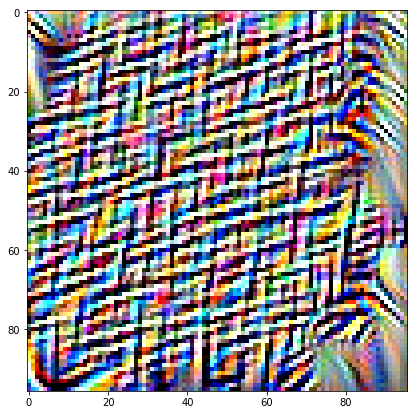

In [83]:
# early layer
img = fv.visualize(56,m[0][4][1],4,upscaling_steps=4,print_losses=True)
plt.figure(figsize=(7,7))
plt.imshow(img)

0 - 0 - -0.09031827002763748
0 - 5 - -0.8015374541282654
0 - 10 - -1.2367390394210815
0 - 15 - -1.6897859573364258
3 - 0 - -2.490107536315918
3 - 5 - -3.8804237842559814
3 - 10 - -4.956368446350098
3 - 15 - -5.984996318817139
3 - 20 - -7.0289154052734375
3 - 25 - -8.106579780578613


<Figure size 504x504 with 0 Axes>

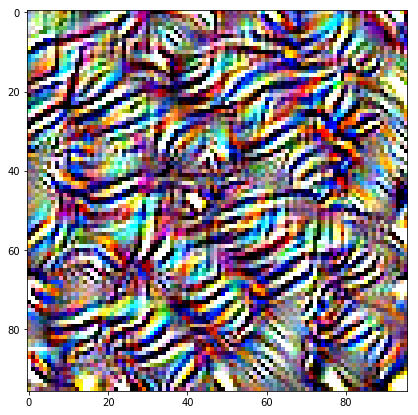

In [84]:
# early layer
img = fv.visualize(56,m[0][4][-1],4,upscaling_steps=4,print_losses=True)
plt.figure(figsize=(7,7))
plt.imshow(img)

## 0,5

In [80]:
m[0][5]

Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(256, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(128, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(256, 512, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(512, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(128, 

0 - 0 - -0.1369178742170334
0 - 5 - -0.777141273021698
0 - 10 - -1.054640531539917
0 - 15 - -1.2441736459732056
3 - 0 - -1.1820045709609985
3 - 5 - -1.7777276039123535
3 - 10 - -2.002187967300415
3 - 15 - -2.1674282550811768
6 - 0 - -1.3133788108825684
6 - 5 - -2.0729360580444336
6 - 10 - -2.3790700435638428
6 - 15 - -2.5993242263793945
6 - 20 - -2.777928113937378
6 - 25 - -2.938973903656006


<Figure size 504x504 with 0 Axes>

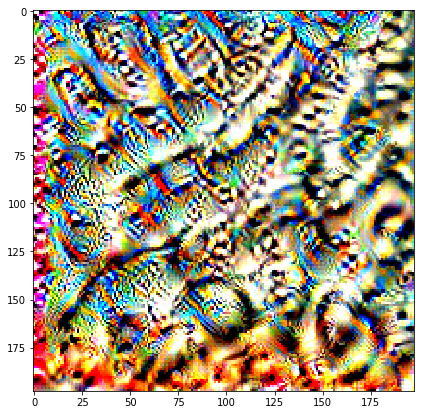

In [77]:
# end of group 1
img = fv.visualize(56,m[0][5][1],5,upscaling_steps=8,print_losses=True)
plt.figure(figsize=(7,7))
plt.imshow(img)

0 - 0 - -0.6150658130645752
0 - 5 - -1.322160005569458
0 - 10 - -1.590394377708435
0 - 15 - -1.7764643430709839
3 - 0 - -1.7852164506912231
3 - 5 - -2.313739538192749
3 - 10 - -2.514029026031494
3 - 15 - -2.65513014793396
6 - 0 - -1.7497273683547974
6 - 5 - -2.380218982696533
6 - 10 - -2.620434045791626
6 - 15 - -2.783628225326538
6 - 20 - -2.9096946716308594
6 - 25 - -3.015460729598999


<Figure size 504x504 with 0 Axes>

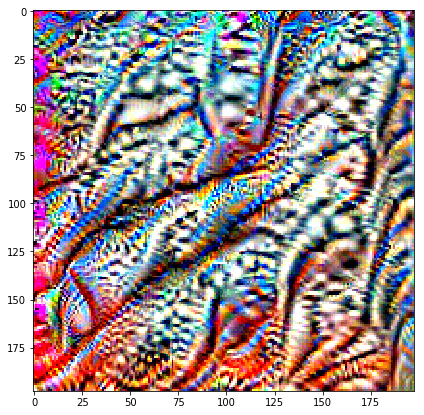

In [78]:
# end of group 1
img = fv.visualize(56,m[0][5][-1],5,upscaling_steps=8,print_losses=True)
plt.figure(figsize=(7,7))
plt.imshow(img)

## 0,6

In [88]:
m[0][6]

Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(

<Figure size 504x504 with 0 Axes>

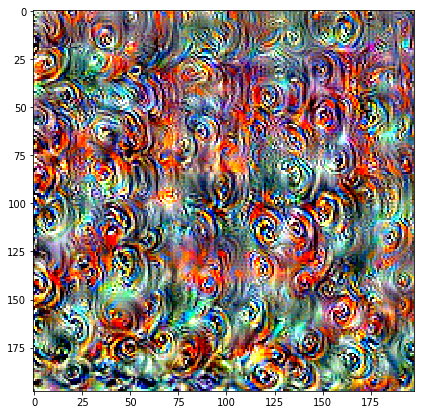

In [92]:
img = fv.visualize(56,m[0][6][1],4,upscaling_steps=8)
plt.figure(figsize=(7,7))
plt.imshow(img)

<Figure size 504x504 with 0 Axes>

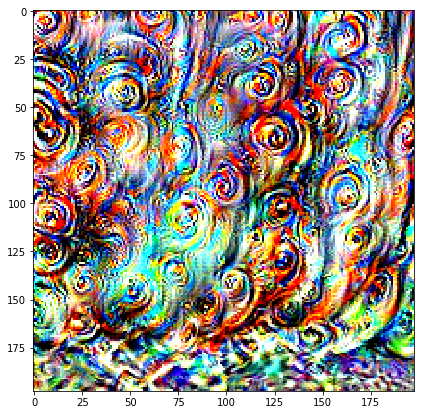

In [93]:
img = fv.visualize(56,m[0][6][-1],4,upscaling_steps=8)
plt.figure(figsize=(7,7))
plt.imshow(img)

## 0,7

In [87]:
m[0][7]

Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2

<Figure size 504x504 with 0 Axes>

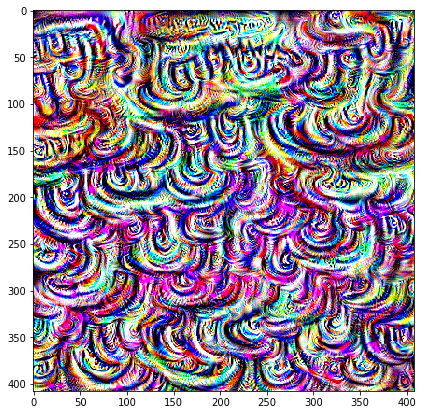

In [95]:
img = fv.visualize(56,m[0][7][1],1)
plt.figure(figsize=(7,7))
plt.imshow(img)

<Figure size 504x504 with 0 Axes>

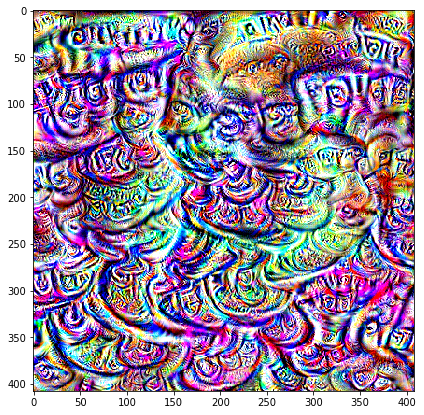

In [96]:
img = fv.visualize(56,m[0][7][-1],1)
plt.figure(figsize=(7,7))
plt.imshow(img)

# Plotting mean activations per feature map and corresponding input space

In [11]:
def plot_activations_and_reconstructions(imgs,activations,filters,
                                         transformed_img,n_cols=3,
                                         cell_size=4,layer_name='',
                                         save_fig=False,album_hash=None):
    n_rows = math.ceil((len(imgs)+1)/n_cols)

    fig = plt.figure(figsize=(cell_size*n_cols,cell_size*n_rows))
    gs = gridspec.GridSpec(n_rows, n_cols)
    tr_im_ax = plt.subplot(gs[0,0])
    tr_im_ax.grid(False)
    tr_im_ax.get_xaxis().set_visible(False)
    tr_im_ax.get_yaxis().set_visible(False)
    tr_im_ax.imshow(transformed_img)
    tr_im_ax.set_title('Image')
    
    act_ax = plt.subplot(gs[0, 1:])
    
    
    act = act_ax.plot(np.clip(activations,0.,None),linewidth=2.)
    for el in filters:
        act_ax.axvline(x=el, color='red', linestyle='--',alpha=0.4)
    act_ax.set_xlim(0,len(activations));
    act_ax.set_ylabel(f"mean activation");
    if layer_name == '':
        act_ax.set_title('Mean Activations')
    else:
        act_ax.set_title(f'{layer_name}')
    act_ax.set_facecolor('white')
    
    fmap_axes = []
    for r in range(1,n_rows):
        for c in range(n_cols):
            fmap_axes.append(plt.subplot(gs[r, c]))
            
    for i,ax in enumerate(fmap_axes):
        ax.grid(False)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        if i>=len(filters):
            pass

        ax.set_title(f'fmap {filters[i]}')

        ax.imshow(imgs[i])
    plt.tight_layout()
    save_name = layer_name.lower().replace(' ','_')
#     if save_fig:
#         plt.savefig(f'{save_name}.png')
#         upload_to_imgur(f'{save_name}.png',
#                         f'{save_name}',album_hash)
#         plt.close()
#     else:
    plt.show()
        
  

In [12]:
FV = FilterVisualizer(m)

In [13]:
def activations_and_reconstructions(img,fmap_layer,
                                    top_num=4,init_size=56,
                                    upscaling_steps=12, upscaling_factor=1.2,
                                    opt_steps=20, blur=5,lr=1e-1,
                                    print_losses=False,
                                    n_cols=3, cell_size=4,
                                    layer_name='',
                                    save_fig=False,
                                    album_hash=None):
    
    mean_acts = FV.most_activated(img,layer = fmap_layer)

    most_act_fmaps = sorted(range(len(mean_acts)), key=lambda i: mean_acts[i])[-top_num:][::-1]

    imgs = []
    for filter in most_act_fmaps:
        imgs.append(FV.visualize(init_size,fmap_layer, filter, upscaling_steps=upscaling_steps, 
                                 upscaling_factor=upscaling_factor, 
                                 opt_steps=opt_steps, blur=blur,
                                 lr=lr,print_losses=False))
    transformed_img = FV.get_transformed_img(img,224)
    
    plot_activations_and_reconstructions(imgs,mean_acts,
                                         most_act_fmaps,transformed_img,
                                         n_cols=n_cols,cell_size=cell_size,
                                         layer_name=layer_name,
                                         save_fig=save_fig,
                                         album_hash=album_hash)

# Visualize feature map with highest mean activation for an input

In [14]:
(PATH/'valid').ls()

[PosixPath('data_draw/valid/pocahontas'),
 PosixPath('data_draw/valid/mulan'),
 PosixPath('data_draw/valid/kiki'),
 PosixPath('data_draw/valid/howl'),
 PosixPath('data_draw/valid/hercules'),
 PosixPath('data_draw/valid/mermaid'),
 PosixPath('data_draw/valid/beauty'),
 PosixPath('data_draw/valid/castle'),
 PosixPath('data_draw/valid/mononoke'),
 PosixPath('data_draw/valid/tarzan')]

## mermaid

In [18]:
imgs=(PATH/'valid/mermaid').ls()

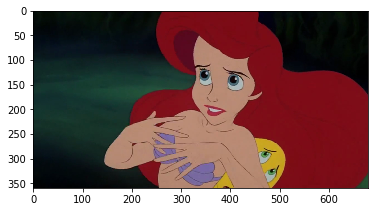

In [25]:
im = np.array(PIL.Image.open(str(imgs[6])).convert('RGB')).astype(np.float32)/255
plt.imshow(im)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


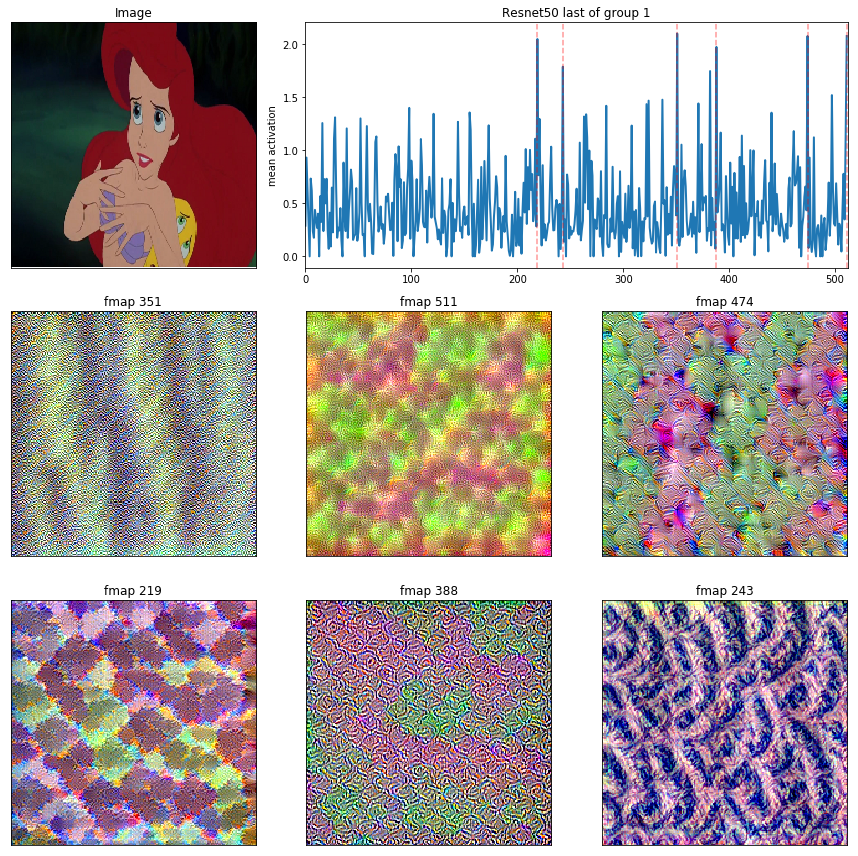

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


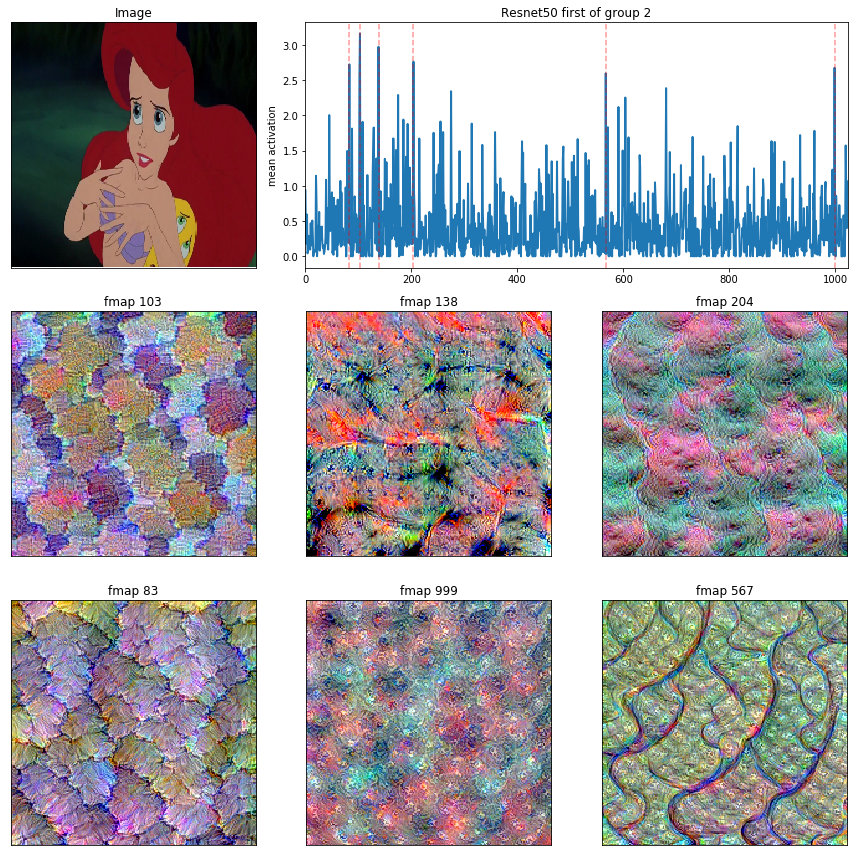

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


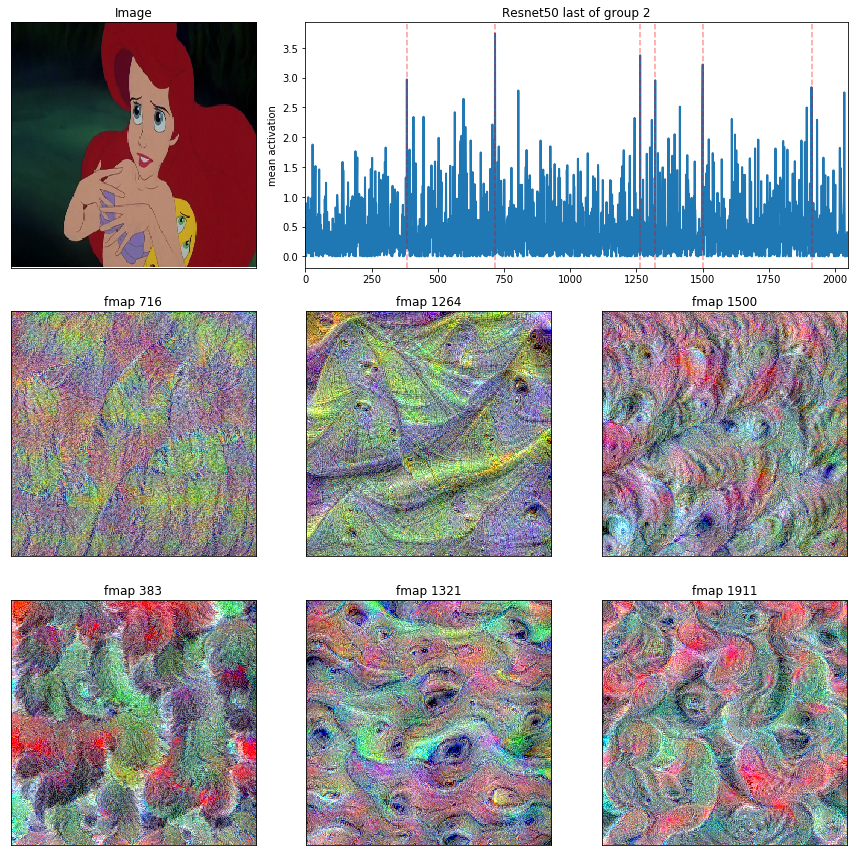

In [26]:
im_path = str(imgs[6])

im = np.array(PIL.Image.open(im_path).convert('RGB')).astype(np.float32)/255
activations_and_reconstructions(im,m[0][5][-1],top_num=6,upscaling_steps=8,layer_name='Resnet50 last of group 1')

# mid layer

activations_and_reconstructions(im,m[0][6][-1],top_num=6,upscaling_steps=8,layer_name='Resnet50 first of group 2')

# later layer
activations_and_reconstructions(im,m[0][7][-1],top_num=6,layer_name='Resnet50 last of group 2')

## howl

In [188]:
imgs=(PATH/'valid/howl').ls()

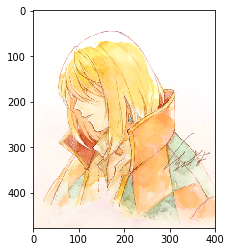

In [230]:
im = np.array(PIL.Image.open(str(imgs[17])).convert('RGB')).astype(np.float32)/255
plt.imshow(im)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


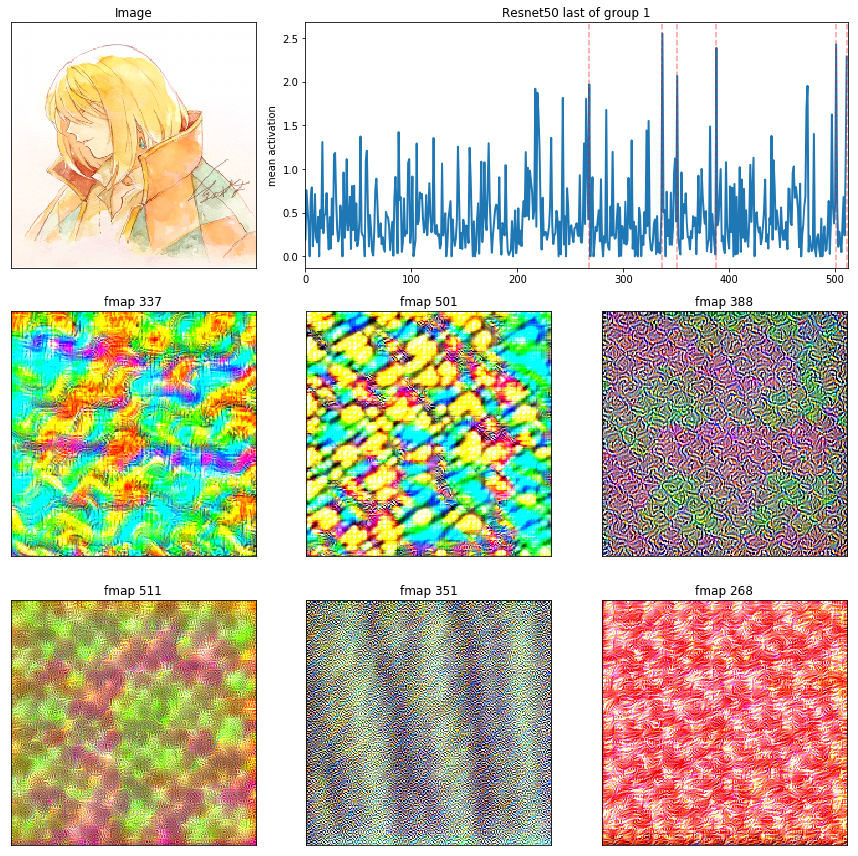

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


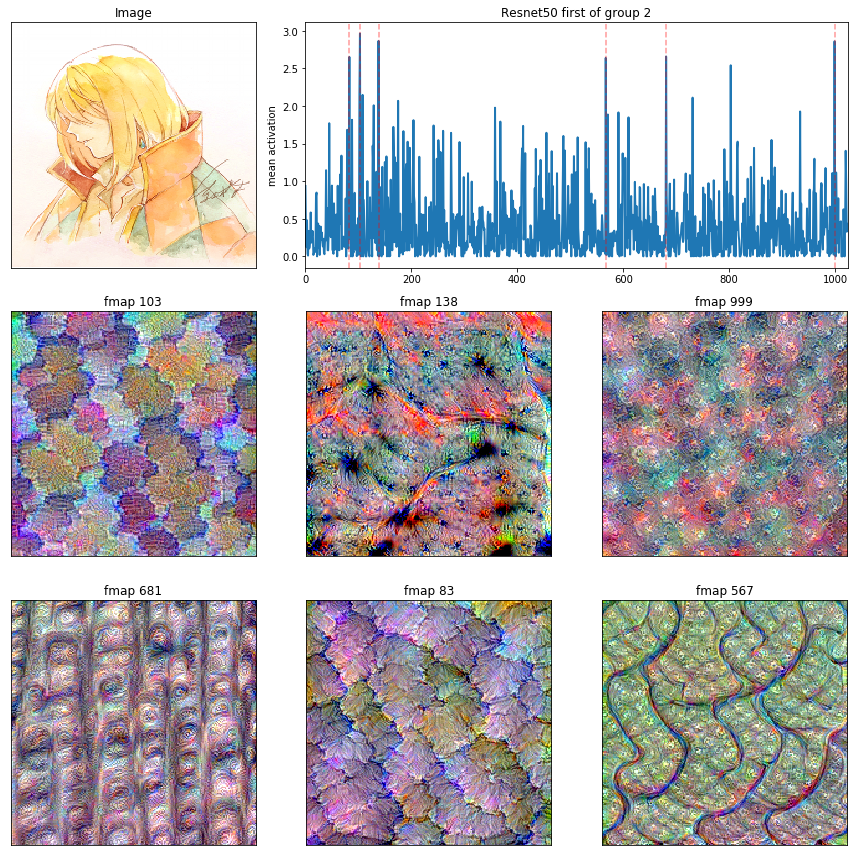

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


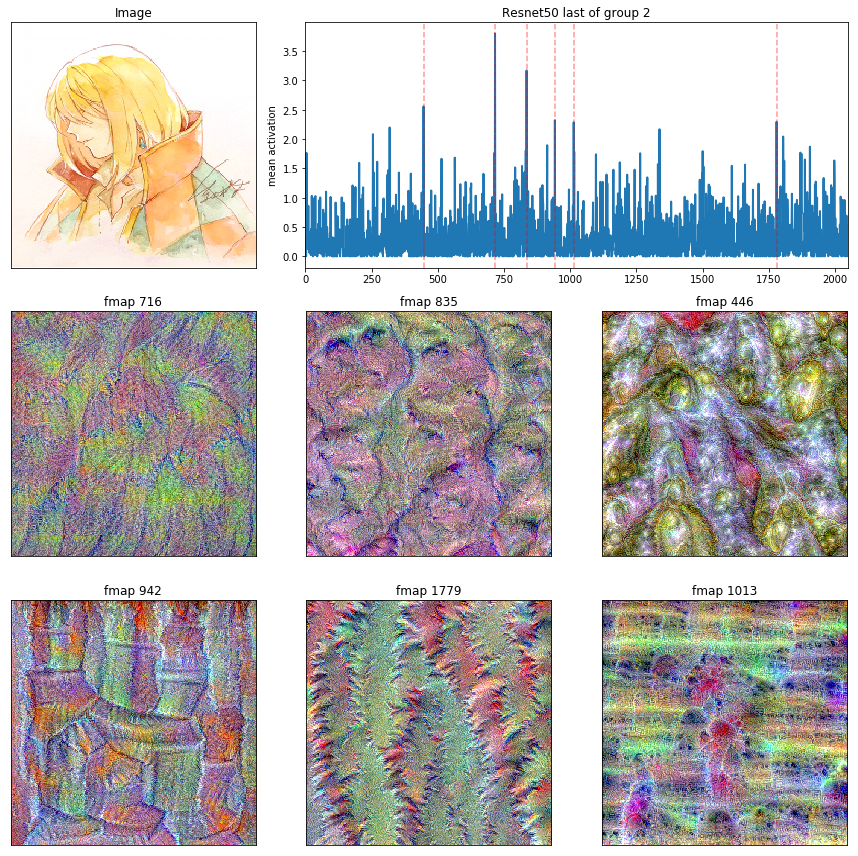

In [210]:
im_path = str(imgs[17])

im = np.array(PIL.Image.open(im_path).convert('RGB')).astype(np.float32)/255
activations_and_reconstructions(im,m[0][5][-1],top_num=6,upscaling_steps=8,layer_name='Resnet50 last of group 1')

# mid layer

activations_and_reconstructions(im,m[0][6][-1],top_num=6,upscaling_steps=8,layer_name='Resnet50 first of group 2')

# later layer
activations_and_reconstructions(im,m[0][7][-1],top_num=6,layer_name='Resnet50 last of group 2')

## hercules

In [123]:
imgs=(PATH/'valid/castle').ls()

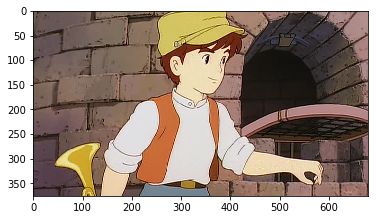

In [126]:
im = np.array(PIL.Image.open(str(imgs[2])).convert('RGB')).astype(np.float32)/255
plt.imshow(im)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


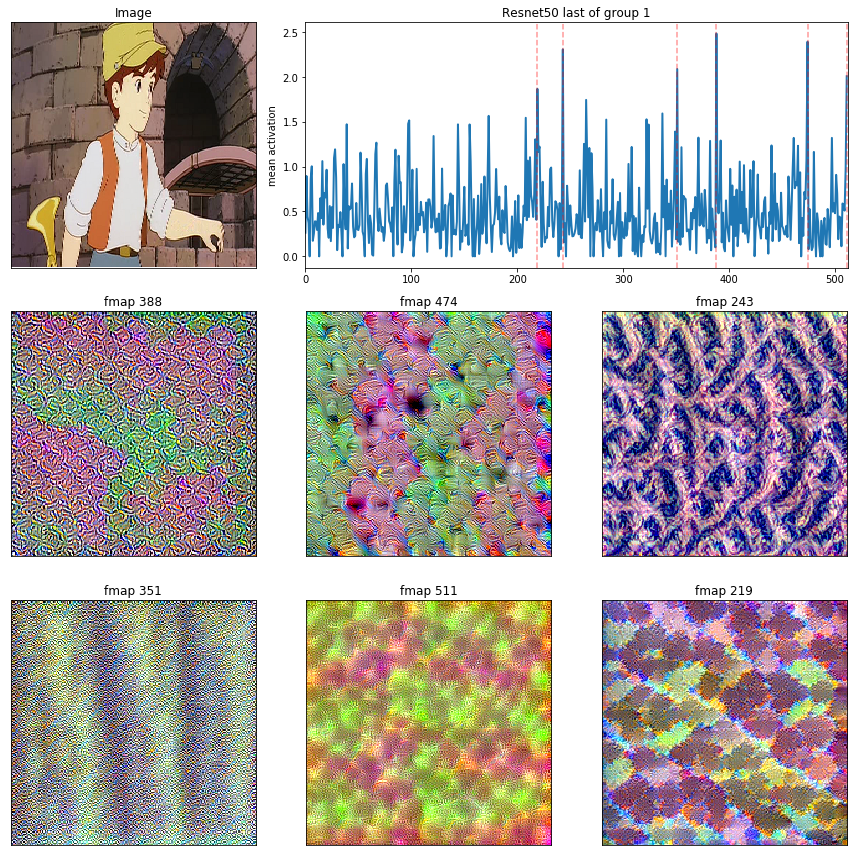

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


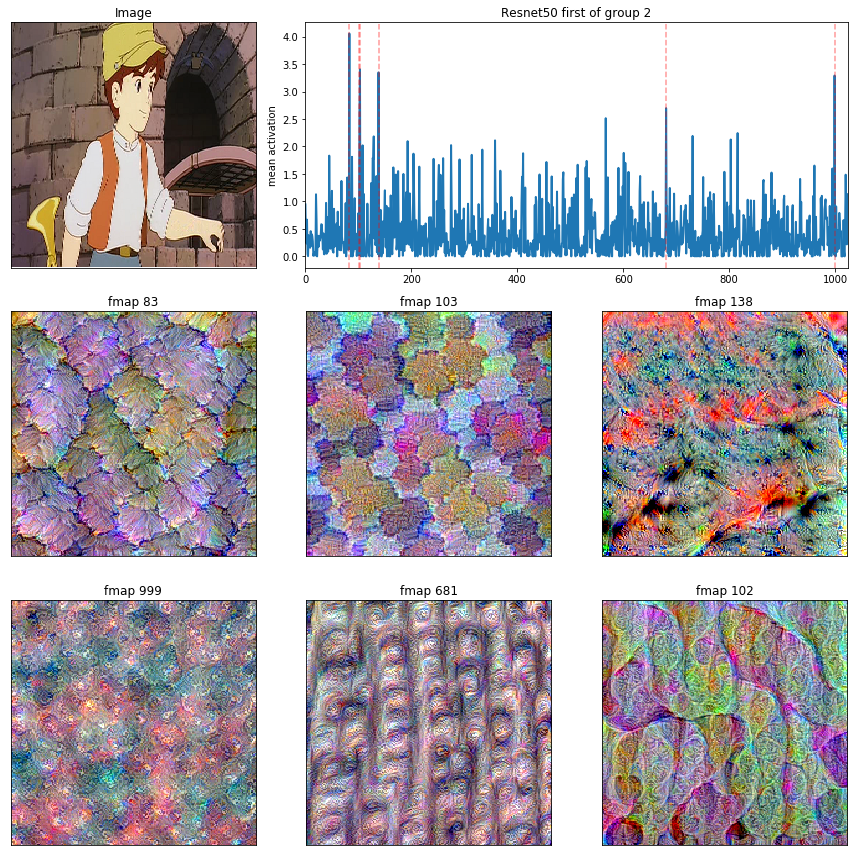

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


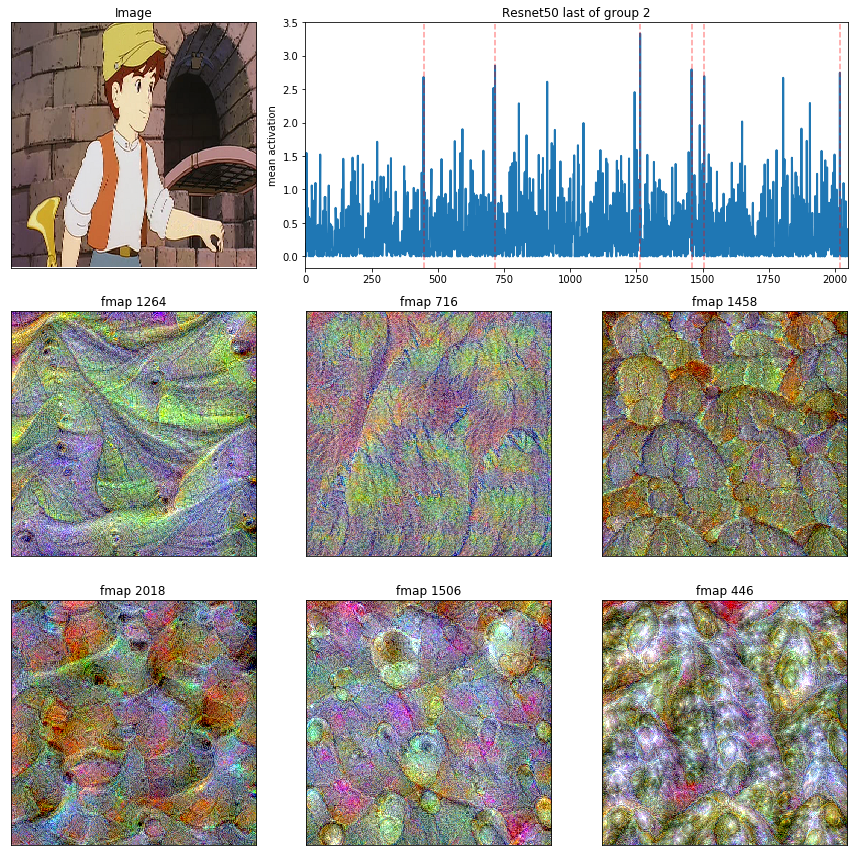

In [127]:
im_path = str(imgs[2])

im = np.array(PIL.Image.open(im_path).convert('RGB')).astype(np.float32)/255
activations_and_reconstructions(im,m[0][5][-1],top_num=6,upscaling_steps=8,layer_name='Resnet50 last of group 1')

# mid layer

activations_and_reconstructions(im,m[0][6][-1],top_num=6,upscaling_steps=8,layer_name='Resnet50 first of group 2')

# later layer
activations_and_reconstructions(im,m[0][7][-1],top_num=6,layer_name='Resnet50 last of group 2')